In [43]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import astropy.units as u
from astropy import wcs
from astropy.wcs.utils import fit_wcs_from_points
from astropy.coordinates import SkyCoord

from skycam_utils.astrometry import load_wcs

In [4]:
datadir = Path("/mnt/d/sky_brightness/old_skycam/20190606")
frames = []
for csv in datadir.glob("*.csv"):
    frames.append(pd.read_csv(csv))

data = pd.concat(frames)

In [5]:
data['UT'] = pd.to_datetime(data['UT'])

<AxesSubplot:xlabel='UT'>

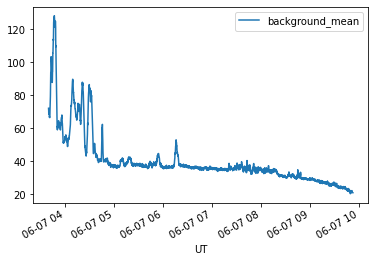

In [6]:
g = data.groupby('Star Name')
arcturus = g.get_group('Arcturus')
arcturus.plot(x='UT', y='background_mean')

In [7]:
arcturus.columns

Index(['HD', 'Vmag', 'U-B', 'B-V', 'V-R', 'R-I', 'V-Rc', 'Rc-Ic', 'u_mag',
       'g_mag', 'r_mag', 'i_mag', 'z_mag', 'Star Name', 'Identity', 'SAO',
       'FK5', 'Magnitude', 'Spectral class', 'pm_RA', 'pm_Dec', 'RA', 'Dec',
       'Alt', 'Az', 'id', 'xcentroid', 'ycentroid', 'source_sum',
       'background_mean', 'obs_mag', 'UT'],
      dtype='object')

In [8]:
g.groups.keys()
    


dict_keys(['Achird', 'Acrab', 'Adhafera', 'Al Giedi', 'Albireo', 'Alcor', 'Alderamin', 'Alfirk', 'Algenib', 'Algieba', 'Algorab', 'Alioth', 'Alkaid', 'Alkalurops', 'Almach', 'Alphecca', 'Alpheratz', 'Alrai', 'Alshain', 'Altair', 'Altais', 'Alterf', 'Alula Australis', 'Alula Borealis', 'Alwaid', 'Alya', 'Antares', 'Arcturus', 'Arrakis', 'Ascella', 'Asellus Australis', 'Asellus Borealis', 'Auva', 'Baham', 'Benetnasch', 'Caph', 'Celbalrai', 'Chort', 'Cor Caroli', 'Coxa', 'Cujam', 'Dabih', 'Deneb', 'Deneb Algiedi', 'Denebola', 'Dschubba', 'Dubhe', 'Dziban', 'Edasich', 'Eltanin', 'Enif', 'Errai', 'Gemma', 'Giauzar', 'Giedi', 'Gienah', 'Graffias', 'Grumium', 'Homam', 'Izar', 'Jabbah', 'Kaus Borealis', 'Kaus Media', 'Kelb al Rai', 'Kochab', 'Kornephoros', 'Kraz', 'Kuma', 'Kurah', 'Lesath', 'Maasym', 'Marfik', 'Markab', 'Matar', 'Megrez', 'Merak', 'Mirach', 'Mizar', 'Muphrid', 'Muscida', 'Nasl', 'Navi', 'Nekkar', 'Nodus Secundus', 'Nunki', 'Nusakan', 'Phad', 'Phecda', 'Pherkad', 'Polaris', 'Po

<AxesSubplot:xlabel='UT'>

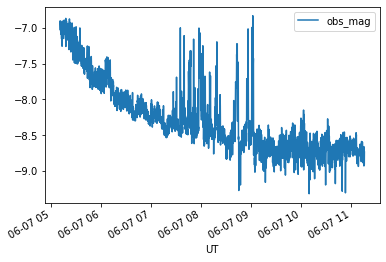

In [9]:
polaris = g.get_group('Sadr')
polaris.plot(x='UT', y="obs_mag")

In [11]:
wcs_initial = load_wcs(year=2019)

In [37]:
wcs_astropy = fit_wcs_from_points(
    (data['xcentroid'].array, data['ycentroid'].array), 
    SkyCoord(data['Az']*u.deg, data['Alt']*u.deg),
    projection=wcs_initial,
    proj_point=SkyCoord(0*u.deg, 90*u.deg),
    sip_degree=3
)
wcs_astropy

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---ZEA-SIP'  'DEC--ZEA-SIP'  
CRVAL : 0.0  90.0  
CRPIX : 320.52648458941707  236.16628213832135  
CD1_1 CD1_2  : 0.2521862519044431  0.03923292919510188  
CD2_1 CD2_2  : -0.038492717305253325  0.2534045482954196  
NAXIS : 474.9821564329958  456.3574094959445

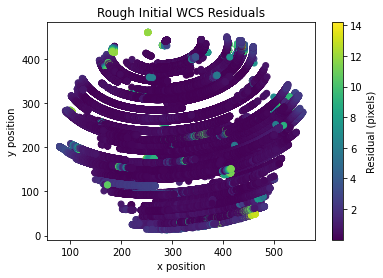

In [38]:
fit_x, fit_y = wcs_astropy.all_world2pix(data['Az']*u.deg, data['Alt']*u.deg, 0)
resid_d = ((fit_x-data['xcentroid'])**2+(fit_y-data['ycentroid'])**2)**0.5
plt.scatter(fit_x, fit_y, c=resid_d)
cb = plt.colorbar()
cb.set_label('Residual (pixels)')
plt.xlabel('x position')
plt.ylabel('y position')
plt.title('Rough Initial WCS Residuals')
plt.show()

In [39]:
resid_d.mean()

0.6250862981724974

In [46]:
wcs_astropy.to_fits(relax=wcs.wcs.WCSHDO_SIP).writeto("wcs_2019.fits", overwrite=True)

In [45]:
wcs_astropy.to_header_string(relax=wcs.wcs.WCSHDO_SIP)

"WCSAXES =                    2 / Number of coordinate axes                      CRPIX1  =      320.52648458942 / Pixel coordinate of reference point            CRPIX2  =      236.16628213832 / Pixel coordinate of reference point            PC1_1   =     0.25218625190444 / Coordinate transformation matrix element       PC1_2   =    0.039232929195102 / Coordinate transformation matrix element       PC2_1   =   -0.038492717305253 / Coordinate transformation matrix element       PC2_2   =     0.25340454829542 / Coordinate transformation matrix element       CDELT1  =                  1.0 / [deg] Coordinate increment at reference point  CDELT2  =                  1.0 / [deg] Coordinate increment at reference point  CUNIT1  = 'deg'                / Units of coordinate increment and value        CUNIT2  = 'deg'                / Units of coordinate increment and value        CTYPE1  = 'RA---ZEA-SIP'       / TAN (gnomonic) projection + SIP distortions    CTYPE2  = 'DEC--ZEA-SIP'       / TAN (g